# KCNT2 Design Notebook

In this notebook we propose ASO's to quantify the performance of oligo-1 in prioritising ASO design.

## Import Ensembl 110 data

In [1]:
from pyensembl import EnsemblRelease
from Bio import SeqIO
import gzip

# Load Ensembl release 110 for human
data = EnsemblRelease(110, species='human')

def reverse_complement(seq):
    complement = {'A': 'T', 'C': 'G', 'G': 'C', 'T': 'A'}
    return ''.join(complement.get(base, base) for base in reversed(seq))

# Load the reference genome into memory using Biopython with gzip support
print("Loading reference genome into memory...")
reference = {}
with gzip.open("/Users/barneyh/dphil/asogym/www/Homo_sapiens.GRCh38.dna_sm.primary_assembly.fa.gz", "rt") as handle:
    for record in SeqIO.parse(handle, "fasta"):
        reference[record.id] = str(record.seq)
print("Reference genome loaded.")


Loading reference genome into memory...
Reference genome loaded.


## Get KCNT2 + KCNT1 canonical sequences

In [2]:
KCNT2 = data.genes_by_name('KCNT2')[0]
KCNT1 = data.genes_by_name('KCNT1')[0]

canonical_KCNT2 = [transcript for transcript in KCNT2.transcripts if transcript.transcript_name == 'KCNT2-201'][0]
canonical_KCNT1 = [transcript for transcript in KCNT1.transcripts if transcript.transcript_name == 'KCNT1-202'][0]

canonical_KCNT2_seq = reference[canonical_KCNT2.contig][canonical_KCNT2.start-1:canonical_KCNT2.end].upper()
canonical_KCNT1_seq = reference[canonical_KCNT1.contig][canonical_KCNT1.start-1:canonical_KCNT1.end].upper()


## Let's plot KCNT2 transcripts

The genome range of the canonical transcript is inclusive of all other isoforms hence I'm happy to just design against the canonical.

In [3]:
# Get all transcripts for the gene
transcripts = KCNT2.transcripts

# Add visualization of all transcripts
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

# Set up the figure
plt.figure(figsize=(20, 12), dpi=600)

# Create the transcript visualization subplot
ax1 = plt.subplot(111)  # Single plot instead of GridSpec

# Get gene boundaries and expand by 0.01 Mb (10,000 bp) on each side
gene_min = KCNT2.start
gene_max = KCNT2.end
padding = 10000  # 0.01 Mb in base pairs
plot_min = gene_min - padding
plot_max = gene_max + padding

# Sort transcripts by length (optional)
transcripts = sorted(transcripts, key=lambda t: len(t.exons), reverse=True)

# Plot all transcripts in genome browser style
num_transcripts = len(transcripts)
y_positions = np.linspace(0.1, 0.9, num_transcripts)
exon_height = 0.8 / (num_transcripts + 1)  # Adjust height based on number of transcripts

# Plot each transcript
for i, transcript in enumerate(transcripts):
    y_pos = y_positions[i]
    
    # Draw the intron line across the entire transcript
    ax1.plot([transcript.start, transcript.end], [y_pos, y_pos], color='black', linewidth=1)
    
    # Draw boxes for exons
    for exon in transcript.exons:
        ax1.add_patch(patches.Rectangle(
            (exon.start, y_pos - exon_height/2), 
            exon.end - exon.start, 
            exon_height, 
            edgecolor='black',
            alpha=0.8
        ))

# Configure the transcripts plot
ax1.set_xlim(plot_min, plot_max)  # Use expanded boundaries
ax1.set_ylim(0, 1)
ax1.grid(True, linestyle='--', alpha=0.3)

# Create y-tick labels with transcript names
y_ticks = []
y_labels = []
for i, transcript in enumerate(transcripts):
    y_ticks.append(y_positions[i])
    transcript_name = transcript.transcript_name
    if transcript == canonical_KCNT2:
        transcript_name += ' (canonical)'
    y_labels.append(f"{transcript_name} ({transcript.biotype})")

ax1.set_yticks(y_ticks)
ax1.set_yticklabels(y_labels, fontsize=8)
ax1.set_title('KCNT2 Transcript Structure')

# Format x-axis to show positions in a more readable way (in Mb)
def format_mb(x, pos):
    return f'{x/1e6:.2f}'

ax1.xaxis.set_major_formatter(plt.FuncFormatter(format_mb))
ax1.set_xlabel('Genomic Position (Mb)')

ax1.set_xlim(plot_min, plot_max)

plt.tight_layout()
plt.show()

## Running oligo-1 against KCNT1

- KCNT2 is negative strand and KCNT1 is positive strand.
- Say we want to design an ASO targetting segment of KCNT2 - chr1:196225800-196225820 corresponding to TTGTAGAGGATATTTTGGTT
- This segment will be transcribed to the mRNA AACCAAAAUAUCCUCUACAA because KCNT2 is on the negative strand, and during transcription of negative strand genes, the reverse complementary strand serves as the template.
- As the ASO must be reverse complementary to the mRNA and as reverse complementary is an involution (f(f(x))=x) the ASO sequence will be TTGTAGAGGATATTTTGGTT

In [4]:
from ml.assess import sequence_to_tensor, get_device
import torch
import tqdm
import pickle

def create_asos(reference, aso_length=20, strand='+'):
    seen_asos = set()
    asos_w_pos = []
    for i in range(len(reference) - aso_length):
        if strand == '+':
            aso = reverse_complement(reference[i:i+aso_length])
        elif strand == '-':
            aso = reference[i:i+aso_length]
        if aso in seen_asos: continue
        seen_asos.add(aso)

        asos_w_pos.append((aso, i))

    print(f"{i-len(seen_asos)} removed ASOs")

    return asos_w_pos

with open('data/checkpoints/BiLSTMEncoder_Sugar_Backbone_embedding_dim64_hidden_dim64_num_layers2_dropout0.25_lr0.0001_bs4096_ep10.pkl', 'rb') as f:
    oligo1 = pickle.load(f)

device = get_device()

sugar = ['MOE'] * 5 + [None] * 10 + ['MOE'] * 5
backbone = [True] * 19 + [False]

KCNT2_asos = create_asos(canonical_KCNT2_seq, aso_length=20, strand='-')
num_KCNT2_asos = len(KCNT2_asos)

# Preallocate tensors with the correct sizes
seq_tensor = torch.zeros((num_KCNT2_asos, oligo1.max_len), dtype=torch.long, device=device)
sugar_tensor = torch.zeros((num_KCNT2_asos, oligo1.max_len), dtype=torch.long, device=device)
backbone_tensor = torch.zeros((num_KCNT2_asos, oligo1.max_len), dtype=torch.long, device=device)

# Process all sequences
for i in tqdm.tqdm(range(num_KCNT2_asos)):
    sequence = KCNT2_asos[i][0]
    seq_t, sugar_t, backbone_t = sequence_to_tensor(sequence, sugar, backbone, device=device, max_len=oligo1.max_len)
    seq_tensor[i] = seq_t
    sugar_tensor[i] = sugar_t
    backbone_tensor[i] = backbone_t


3511 removed ASOs


100%|██████████| 379130/379130 [03:15<00:00, 1940.48it/s]


## Let's check if any our ASO's in ASO Atlas complement KCNT2.

I have manually checked all 12 ASO's in both ASO Atlas and KCNT2 and all of these are random collisions (there is no KCNT2 assay in the patents).

In [5]:
with open('data/aso_inhibitions_15_03_25_incl_metadata_df.pkl', 'rb') as f:
    aso_df = pickle.load(f)

aso_in_kcnt2 = 0

for custom_id, custom_id_group in aso_df.groupby('custom_id'):
    n_seqs = len(custom_id_group)
    for j, row in custom_id_group.iterrows():
        aso_seq = row['aso_sequence_5_to_3']
        if aso_seq in canonical_KCNT2_seq:
            aso_in_kcnt2 += 1
            print(f"Collision found with custom_id: {custom_id}")

print("There are", aso_in_kcnt2, "ASOs in ASO Atlas that are within the KCNT2 gene")

Collision found with custom_id: data/step5_all/20050282760-application_00001_table.xml.gz
Collision found with custom_id: data/step5_all/20150167008-application_00002_table.xml.gz
Collision found with custom_id: data/step5_all/20160348104-application_00001_table.xml.gz
Collision found with custom_id: data/step5_all/20160348104-application_00001_table.xml.gz
Collision found with custom_id: data/step5_all/20180273577-application_00019_table.xml.gz
Collision found with custom_id: data/step5_all/20220243205-application_00067_table.xml.gz
Collision found with custom_id: data/step5_all/20220315927-application_00035_table.xml.gz
Collision found with custom_id: data/step5_all/20220324900-application_00142_table.xml.gz
Collision found with custom_id: data/step5_all/20230263822-application_00044_table.xml.gz
Collision found with custom_id: data/step5_all/20230263822-application_00044_table.xml.gz
Collision found with custom_id: data/step5_all/20230263822-application_00044_table.xml.gz
Collision 

## Let's check how many of the KCNT2 ASO's will also target KCNT1.

In [6]:
KCNT1_asos = create_asos(canonical_KCNT1_seq, aso_length=20, strand='+')

# Extract only the sequence part (first element) from each tuple in KCNT2_asos
KCNT1_asos_sequences = [aso[0] for aso in KCNT1_asos]
KCNT2_asos_sequences = [aso[0] for aso in KCNT2_asos]

KCNT2_asos_in_KCNT1 = len(set(KCNT2_asos_sequences) & set(KCNT1_asos_sequences))

print(f"{KCNT2_asos_in_KCNT1}/{len(KCNT2_asos)} KCNT2 ASOs also target the KCNT1 gene")


1345 removed ASOs
308/379130 KCNT2 ASOs also target the KCNT1 gene


## Let's plot the distribution of predictions.
The magnitude of "Prediction score" is arbitary, only the order matters.

/var/folders/0f/hhx_wwq94z5bk3ln6hh2m9m40000gn/T/ipykernel_70931/2784218421.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


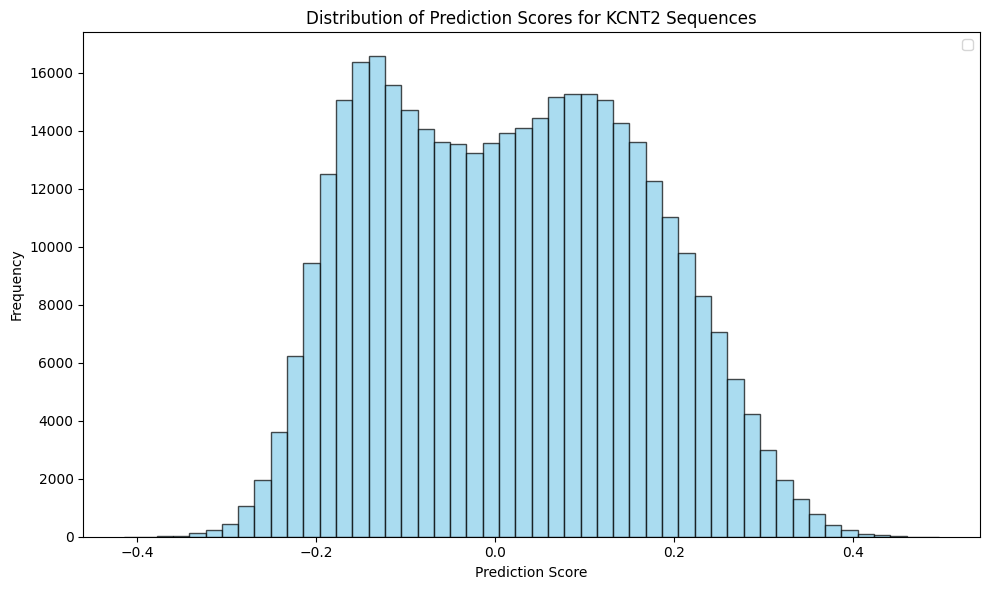

In [7]:
import matplotlib.pyplot as plt

oligo1.eval()
with torch.no_grad():
    oligo1_pred = oligo1.predict(seq_tensor, sugar_tensor, backbone_tensor).cpu().numpy()

# Create histogram of prediction distribution
plt.figure(figsize=(10, 6))
plt.hist(oligo1_pred, bins=50, alpha=0.7, color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('Prediction Score')
plt.ylabel('Frequency')
plt.title('Distribution of Prediction Scores for KCNT2 Sequences')
plt.legend()
plt.tight_layout()
plt.show()


## Let's plot the distribution of scores across the transcript

In [8]:
# Add visualization of all transcripts and ASO inhibition data
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from matplotlib.gridspec import GridSpec

# Set up the figure with GridSpec for better control of subplot sizes
plt.figure(figsize=(20, 12), dpi=600)
gs = GridSpec(2, 1, height_ratios=[2, 3])  # Adjusted height ratio for multiple transcripts

# Create two subplots with shared x-axis
ax1 = plt.subplot(gs[0])  # Transcripts (top)
ax2 = plt.subplot(gs[1], sharex=ax1)  # ASO data (bottom)

plot_min = canonical_KCNT2.start - 10000
plot_max = canonical_KCNT2.end + 10000

# Draw the intron line across the entire transcript
ax1.plot([canonical_KCNT2.start, canonical_KCNT2.end], [0.5, 0.5], color='black', linewidth=1)

# Draw boxes for exons
exon_height = 0.2  # Height of exon boxes
for exon in canonical_KCNT2.exons:
    ax1.add_patch(patches.Rectangle(
        (exon.start, 0.5 - exon_height/2),  # Center at 0.5
        exon.end - exon.start, 
        exon_height, 
        edgecolor='black',
        facecolor='black',
        alpha=0.8
))

# Create a color map from red (low inhibition) to green (high inhibition)
import matplotlib.cm as cm
from matplotlib.colors import Normalize

norm = Normalize(vmin=min(oligo1_pred), vmax=max(oligo1_pred))
cmap = cm.RdYlGn  # Red-Yellow-Green colormap

# Get indices of top-30 predictions
top_30_indices = np.argsort(oligo1_pred.flatten())[-30:]

# Plot all inhibition data as scatter points with color gradient
scatter = ax2.scatter(
    [pos + canonical_KCNT2.start for pos in range(len(oligo1_pred))],
    oligo1_pred,
    c=oligo1_pred,
    cmap=cmap,
    norm=norm,
    s=20,  # Point size
    alpha=0.8,
    linewidth=0.5
)

# Highlight top-30 predictions in red with larger points
top_30_positions = [i + canonical_KCNT2.start for i in top_30_indices]
top_30_values = [oligo1_pred[i] for i in top_30_indices]
ax2.scatter(
    top_30_positions,
    top_30_values,
    color='red',
    s=80,  # Larger size for emphasis
    alpha=0.8,
    linewidth=0.5,
    zorder=3  # Ensure they're drawn on top
)
                
ax2.set_ylabel('Inhibition (%)')
ax2.grid(True, linestyle='--', alpha=0.3)

# Configure the transcripts plot
ax1.set_xlim(plot_min, plot_max)  # Use expanded boundaries
ax1.set_ylim(0.3, 0.7)
ax1.grid(True, linestyle='--', alpha=0.3)  # Add grid lines to match the bottom plot

ax1.set_title('KCNT2 Transcript Structure')

# Hide x-axis labels and ticks for the top subplot
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
# Hide y-axis ticks for top subplot
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# Format x-axis to show positions in a more readable way (in Mb)
def format_mb(x, pos):
    return f'{x/1e6:.2f}'

# Only set x-axis label for bottom plot
ax2.xaxis.set_major_formatter(plt.FuncFormatter(format_mb))
ax2.set_xlabel('Genomic Position (Mb)')

ax1.set_xlim(plot_min, plot_max)
ax2.set_xlim(plot_min, plot_max)

plt.tight_layout()
plt.show()

## worse-6 oligo-1 aso's

We can observe very low GC% content

In [9]:
TOP_K = 30     # Can be modified as needed
BOTTOM_K = 6  # Can be modified as needed
bottom_k_oligo1_indices = np.argsort(oligo1_pred.flatten())[:BOTTOM_K]

# Calculate GC content for a sequence
def calculate_gc_content(seq):
    return (seq.count('G') + seq.count('C')) / len(seq) * 100

# Get bottom K sequences and calculate average GC content
bottom_k_oligo1_sequences = [KCNT2_asos[idx][0] for idx in bottom_k_oligo1_indices]
bottom_k_oligo1_gc = sum(calculate_gc_content(seq) for seq in bottom_k_oligo1_sequences) / BOTTOM_K

print(f"Bottom {BOTTOM_K} predicted ASOs (avg GC content: {bottom_k_oligo1_gc:.2f}%):")
for i, idx in enumerate(bottom_k_oligo1_indices):
    sequence = KCNT2_asos[idx][0]
    position = KCNT2_asos[idx][1] + canonical_KCNT2.start
    score = oligo1_pred[idx]
    print(f"{i+1}. Sequence: {sequence}, Position: {position}, Score: {score:.4f}")

Bottom 6 predicted ASOs (avg GC content: 20.00%):
1. Sequence: TAGTTTAGGCTGTTTAAAAA, Position: 196535498, Score: -0.4144
2. Sequence: TATGTAAGTTTTATTTCAAT, Position: 196371497, Score: -0.4140
3. Sequence: TTTTTGAGTGTTCAATAGAA, Position: 196550124, Score: -0.3895
4. Sequence: TGAGTTAATTTGTTTTAAAT, Position: 196314063, Score: -0.3891
5. Sequence: GGGGTTAATTTTTTTAAAAA, Position: 196519504, Score: -0.3876
6. Sequence: TTTTGAAGTGTTCATTTAAT, Position: 196355648, Score: -0.3858


### random ASO sequences

In [10]:
# Generate 30 random ASO indices
import random
random.seed(42)  # For reproducibility
total_asos = len(KCNT2_asos)
random_indices = random.sample(range(total_asos), TOP_K)

# Calculate GC content for random sequences
random_sequences = [KCNT2_asos[idx][0] for idx in random_indices]
random_gc = sum(calculate_gc_content(seq) for seq in random_sequences) / TOP_K

print(f"\nRandom 30 ASOs (avg GC content: {random_gc:.2f}%):")
for i, idx in enumerate(random_indices):
    sequence = KCNT2_asos[idx][0]
    position = KCNT2_asos[idx][1] + canonical_KCNT2.start
    present_in_KCNT1 = KCNT2_asos[idx][0] in KCNT1_asos_sequences
    print(f"{i+1}. Sequence: {sequence}, Position: {position}, Present in KCNT1: {present_in_KCNT1}")



Random 30 ASOs (avg GC content: 31.33%):
1. Sequence: ATATTAGAAAGAAAGAAGTT, Position: 196564043, Present in KCNT1: False
2. Sequence: TTCTTCCGAAGTTTCAGAAA, Position: 196284295, Present in KCNT1: False
3. Sequence: CCACATTCAACAATAGTTTC, Position: 196238894, Present in KCNT1: False
4. Sequence: GGTTATGATAAAAAAAAGCG, Position: 196370537, Present in KCNT1: False
5. Sequence: GAAATTTTTGCATATACGTA, Position: 196354538, Present in KCNT1: False
6. Sequence: AGCTGTGGTAATTTGTAATA, Position: 196343144, Present in KCNT1: False
7. Sequence: TTTTTTTTCTATTGTTGTTT, Position: 196299162, Present in KCNT1: False
8. Sequence: GTAGAAATGGGGTTTCACCA, Position: 196279611, Present in KCNT1: False
9. Sequence: GTAAGTAGAGCCATAGGGCA, Position: 196583775, Present in KCNT1: False
10. Sequence: ATACATTTGCTGAGTGTTGA, Position: 196514213, Present in KCNT1: False
11. Sequence: TTAAGTGGACAGAAAGCCAT, Position: 196271434, Present in KCNT1: False
12. Sequence: TTCTAACTCCTTTCCTGAGC, Position: 196537998, Present in KCNT1: F

### top 30 oligo-1 sequences

slightly concerned to see several poly-T's

In [11]:
top_k_oligo1_indices = np.argsort(oligo1_pred.flatten())[-TOP_K:][::-1]  # Reverse to get descending order

# Get top K sequences and calculate average GC content
top_k_oligo1_sequences = [KCNT2_asos[idx][0] for idx in top_k_oligo1_indices]
top_k_oligo1_gc = sum(calculate_gc_content(seq) for seq in top_k_oligo1_sequences) / TOP_K

print(f"\nTop {TOP_K} predicted ASOs (avg GC content: {top_k_oligo1_gc:.2f}%):")
for i, idx in enumerate(top_k_oligo1_indices):
    sequence = KCNT2_asos[idx][0]
    position = KCNT2_asos[idx][1] + canonical_KCNT2.start
    present_in_KCNT1 = KCNT2_asos[idx][0] in KCNT1_asos_sequences
    score = oligo1_pred[idx]
    print(f"{i+1}. Sequence: {sequence}, Position: {position}, Present in KCNT1: {present_in_KCNT1}, Score: {score:.4f}")


Top 30 predicted ASOs (avg GC content: 44.67%):
1. Sequence: GTTCTCTGCCATGCTGCTTT, Position: 196238636, Present in KCNT1: False, Score: 0.4967
2. Sequence: GTCCTTCTTCAACATCACCA, Position: 196385157, Present in KCNT1: False, Score: 0.4965
3. Sequence: GTGTCATTTTCACACACATA, Position: 196596198, Present in KCNT1: False, Score: 0.4924
4. Sequence: GCTCACGCCTGTAATCCCAA, Position: 196348758, Present in KCNT1: False, Score: 0.4812
5. Sequence: TTCCTTTTTTATGGCTGCAT, Position: 196504416, Present in KCNT1: False, Score: 0.4793
6. Sequence: GGTCTTTTCCTACTACCACT, Position: 196471345, Present in KCNT1: False, Score: 0.4776
7. Sequence: GCTCATTTGGCCACCCACAA, Position: 196266934, Present in KCNT1: False, Score: 0.4761
8. Sequence: CTGTGATGTTGGGGTGCCCC, Position: 196298519, Present in KCNT1: False, Score: 0.4737
9. Sequence: GGTCTTTCACCCAGTCTGGT, Position: 196437885, Present in KCNT1: False, Score: 0.4703
10. Sequence: TCCTTTTTTATGGCTGCATA, Position: 196369658, Present in KCNT1: False, Score: 0.4701


### top-30 linear model sequences

In [12]:
import numpy as np

def fast_linear_pred(linear_model, seqs):
    features = torch.zeros(len(seqs), 4, dtype=linear_model.weights.dtype)        
    for i, seq in tqdm.tqdm(enumerate(seqs)):
        stability, gc_content, has_moe, has_cet = linear_model.extract_features(seq, ['MOE'], None)
        features[i, 0] = stability
        features[i, 1] = gc_content
        features[i, 2] = float(has_moe)
        features[i, 3] = float(has_cet)

    predictions = (linear_model.weights @ features.unsqueeze(-1)).squeeze() + linear_model.bias
    return predictions

with open('data/checkpoints/LinearModel.pkl', 'rb') as f:
    linear_model = pickle.load(f)

with torch.no_grad():
    linear_pred = fast_linear_pred(linear_model, KCNT2_asos_sequences).cpu().numpy()

# Get top K sequences and calculate average GC content
top_k_linear_indices = np.argsort(linear_pred.flatten())[-TOP_K:][::-1]  # Reverse to get descending order
top_k_linear_sequences = [KCNT2_asos[idx][0] for idx in top_k_linear_indices]
top_k_linear_gc = sum(calculate_gc_content(seq) for seq in top_k_linear_sequences) / TOP_K

print(f"\nTop {TOP_K} predicted ASOs (avg GC content: {top_k_linear_gc:.2f}%):")
for i, idx in enumerate(top_k_linear_indices):
    sequence = KCNT2_asos[idx][0]
    position = KCNT2_asos[idx][1] + canonical_KCNT2.start
    present_in_KCNT1 = KCNT2_asos[idx][0] in KCNT1_asos_sequences
    print(f"{i+1}. Sequence: {sequence}, Position: {position}, Present in KCNT1: {present_in_KCNT1}")


0it [00:00, ?it/s]

379130it [00:07, 47431.25it/s]


Top 30 predicted ASOs (avg GC content: 79.83%):
1. Sequence: TCCCCCCTCCCCCCACCCCA, Position: 196419327, Present in KCNT1: False
2. Sequence: CCCCCTCCCCCCTCCCCCCA, Position: 196419322, Present in KCNT1: False
3. Sequence: TCCCCCCTCCCCCCTCCCCC, Position: 196419320, Present in KCNT1: False
4. Sequence: CCCCCCTCCCCCCTCCCCCC, Position: 196419321, Present in KCNT1: False
5. Sequence: CCCCCTCCCCCCACCCCACA, Position: 196419329, Present in KCNT1: False
6. Sequence: CCCCCCTCCCCCCACCCCAC, Position: 196419328, Present in KCNT1: False
7. Sequence: TCCCTCCTCCCCCCACCCCA, Position: 196369469, Present in KCNT1: False
8. Sequence: TCCCCCCTCCCCCCATCCCA, Position: 196504228, Present in KCNT1: False
9. Sequence: CCCCTCCCCCCTCCCCCCAC, Position: 196419323, Present in KCNT1: False
10. Sequence: CCCTCCCCCCTCCCCCCACC, Position: 196419324, Present in KCNT1: False
11. Sequence: CCTCCCCCCTCCCCCCACCC, Position: 196419325, Present in KCNT1: False
12. Sequence: CTCCCCCCTCCCCCCACCCC, Position: 196419326, Present in K

## Verification strategies

### Our proposal

The aim of the experimental verification is to showcase the usage of oligo-1 in prioritising ASO designs for screening. In order of expected performance we will test 4 sets:

1. 32 oligo-1 top-30 designs
3. 32 random designs
4. 6 oligo-1 bottom-6 designs

I originally had included our linear model in this set but the designs are ridiculous (80% GC content)

### NATA Proposal

Aim for 50-60 predicted to be the 'most potent'

Around 10 predicted to be inactive / the least active in the model
(e.g. useful as controls)

Around 10 predicted to be 'mid-active' based on the model - e.g. 40% KD if 80% KD is the maximal
(e.g. useful to benchmark the assay and models the real-world requirement for less active molecules)


### Let's check if "TTTTT" appears much in ASO Atlas. What is the average inhibition of ASOs containing "TTTTT"?

Hmm doesn't seem too much of a concern

In [23]:
with open('data/aso_inhibitions_15_03_25_incl_metadata_df.pkl', 'rb') as f:
    aso_df = pickle.load(f)

print(f"There are {len(aso_df[aso_df['aso_sequence_5_to_3'].str.contains('TTTTT')])} ASOs containing 'TTTTT'")
print(f"The average inhibition of ASOs containing 'TTTTT' is {aso_df[aso_df['aso_sequence_5_to_3'].str.contains('TTTTT')]['inhibition_percent'].mean()}%")
print(f"The average inhibition of ASOs not containing 'TTTTT' is {aso_df[~aso_df['aso_sequence_5_to_3'].str.contains('TTTTT')]['inhibition_percent'].mean()}%")


There are 817 ASOs containing 'TTTTT'
The average inhibition of ASOs containing 'TTTTT' is 45.03545899632803%
The average inhibition of ASOs not containing 'TTTTT' is 47.3011592094525%
